<a href="https://colab.research.google.com/github/11TRNP/Autoimmune-Nonautoimmune-Classification/blob/main/Autoimmune_Classification_MobileNetV2_RMSprop_(Augmented).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import Data Science Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Tensorflow Libraries
from tensorflow import keras
from tensorflow.keras import layers,models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import Model
from keras.layers import Rescaling
from keras.layers import Resizing

# System libraries
from pathlib import Path
import os.path
import random

# Visualization Libraries
import matplotlib.cm as cm
import cv2
import seaborn as sns

sns.set_style('darkgrid')

# Metrics
from sklearn.metrics import classification_report, confusion_matrix
import itertools

In [2]:
from google.colab import drive
import os

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [3]:
base_dir = '/content/drive/My Drive/DATASET/source'
output_dir = '/content/drive/My Drive/DATASET/output'
train_dir = '/content/drive/My Drive/DATASET/output/train'
val_dir = '/content/drive/My Drive/DATASET/output/val'
test_dir = '/content/drive/My Drive/DATASET/output/test'
manipulation_dir = '/content/drive/My Drive/DATASET/output/manipulation'
augmented_dir = '/content/drive/My Drive/DATASET/output/manipulation/augmented/'
mask_dir = '/content/drive/My Drive/DATASET/output/manipulation/mask'

print(os.listdir(base_dir))
print(" ")
print(os.listdir(output_dir))

['Autoimun_Dermatomyositis', 'Autoimun_Vitiligo', 'Autoimun_Psoriasis', 'Autoimun_Lichen_Planus', 'Nonautoimun_Tinea', 'Nonautoimun_Eczema', 'Nonautoimun_Herpes', 'Nonautoimun_Keratosis_Seborrheic']
 
['test', 'val', 'manipulation', 'train', 'augmented']


In [4]:
BATCH_SIZE = 32
TARGET_SIZE = (224, 224)

In [5]:
image_dir = Path(augmented_dir)

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.png'))  + list(image_dir.glob(r'**/*.jpeg')) + list(image_dir.glob(r'**/*.gif'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

<ipython-input-6-371b102a4acd>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='dark:salmon_r')


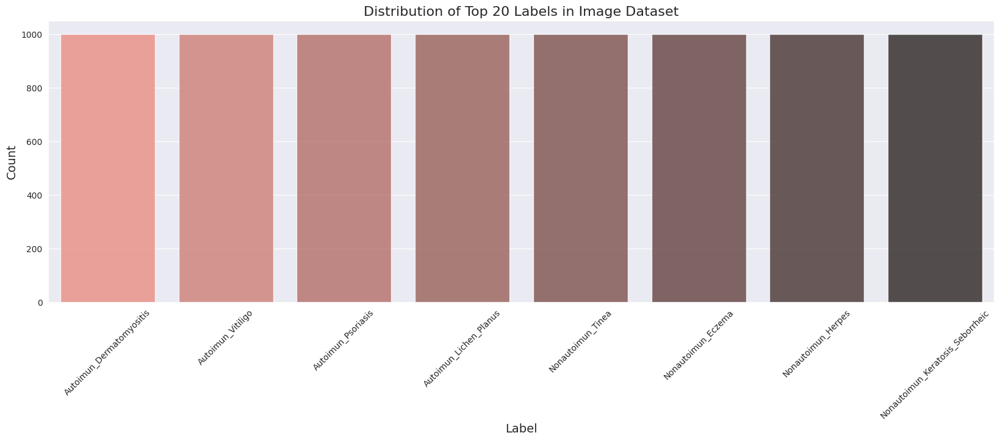

In [6]:
# Get the top 20 labels
label_counts = image_df['Label'].value_counts()[:20]

plt.figure(figsize=(20, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='dark:salmon_r')
plt.title('Distribution of Top 20 Labels in Image Dataset', fontsize=16)
plt.xlabel('Label', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.show()

In [7]:
image_df

,Filepath,Label
0,/content/drive/My Drive/DATASET/output/manipul...,Autoimun_Dermatomyositis
1,/content/drive/My Drive/DATASET/output/manipul...,Autoimun_Dermatomyositis
2,/content/drive/My Drive/DATASET/output/manipul...,Autoimun_Dermatomyositis
3,/content/drive/My Drive/DATASET/output/manipul...,Autoimun_Dermatomyositis
4,/content/drive/My Drive/DATASET/output/manipul...,Autoimun_Dermatomyositis
...,...,...
7995,/content/drive/My Drive/DATASET/output/manipul...,Nonautoimun_Keratosis_Seborrheic
7996,/content/drive/My Drive/DATASET/output/manipul...,Nonautoimun_Keratosis_Seborrheic
7997,/content/drive/My Drive/DATASET/output/manipul...,Nonautoimun_Keratosis_Seborrheic
7998,/content/drive/My Drive/DATASET/output/manipul...,Nonautoimun_Keratosis_Seborrheic


In [9]:
import pandas as pd
import os
from google.colab import sheets

# Daftar nama penyakit
diseases = ['Autoimun_Dermatomyositis', 'Autoimun_Vitiligo', 'Autoimun_Psoriasis', 'Autoimun_Lichen_Planus',
            'Nonautoimun_Tinea', 'Nonautoimun_Eczema', 'Nonautoimun_Herpes', 'Nonautoimun_Keratosis_Seborrheic']

# Assuming 'Filepath' column contains the image paths
# Ambil path base directory dari DataFrame image_df
base_dir = os.path.dirname(image_df['Filepath'][0])  # Changed 'image' to 'Filepath'

# Buat list kosong untuk menyimpan data
data = []

# Iterasi melalui setiap baris di image_df
for index, row in image_df.iterrows():
    # Use 'Filepath' column instead of 'image'
    image_path = row['Filepath']

    # Ekstrak nama penyakit dari path gambar
    disease_name = os.path.basename(os.path.dirname(image_path))

    # Buat dictionary untuk setiap baris data
    row_data = {'image': image_path} # You might want to change this key to 'Filepath' for consistency

    # Inisialisasi semua label penyakit menjadi 0
    for d in diseases:
        row_data[d.lower()] = 0

    # Set label penyakit yang sesuai menjadi 1
    if disease_name in diseases:
        row_data[disease_name.lower()] = 1

    # Tambahkan baris data ke list
    data.append(row_data)

# Buat DataFrame dari list data
label_df = pd.DataFrame(data)

print(label_df)

                                                  image  \
0     /content/drive/My Drive/DATASET/output/manipul...   
1     /content/drive/My Drive/DATASET/output/manipul...   
2     /content/drive/My Drive/DATASET/output/manipul...   
3     /content/drive/My Drive/DATASET/output/manipul...   
4     /content/drive/My Drive/DATASET/output/manipul...   
...                                                 ...   
7995  /content/drive/My Drive/DATASET/output/manipul...   
7996  /content/drive/My Drive/DATASET/output/manipul...   
7997  /content/drive/My Drive/DATASET/output/manipul...   
7998  /content/drive/My Drive/DATASET/output/manipul...   
7999  /content/drive/My Drive/DATASET/output/manipul...   

      autoimun_dermatomyositis  autoimun_vitiligo  autoimun_psoriasis  \
0                            1                  0                   0   
1                            1                  0                   0   
2                            1                  0                   0   

In [10]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=label_df)

https://docs.google.com/spreadsheets/d/1O1X9clps9N8GFLUeda1aSiGQ0P0Dzz8GXv40LsjGqMU#gid=0


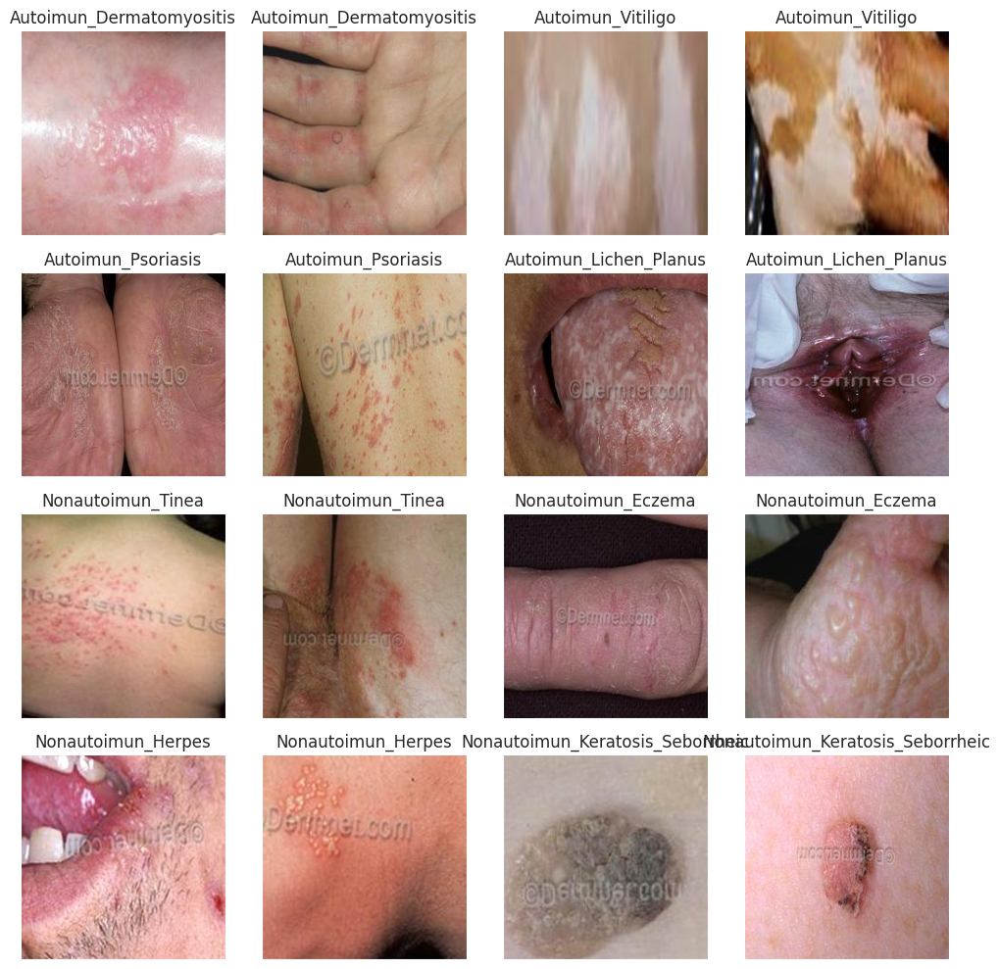

In [11]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

augmented_dir = '/content/drive/My Drive/DATASET/output/manipulation/augmented' # Replace with your base directory
diseases = ['Autoimun_Dermatomyositis', 'Autoimun_Vitiligo', 'Autoimun_Psoriasis', 'Autoimun_Lichen_Planus',
            'Nonautoimun_Tinea', 'Nonautoimun_Eczema', 'Nonautoimun_Herpes', 'Nonautoimun_Keratosis_Seborrheic']

num_images_per_disease = 2

# Collect image paths for each disease
image_paths = []
for disease in diseases:
    disease_dir = os.path.join(augmented_dir, disease)
    image_files = [f for f in os.listdir(disease_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]
    image_paths.extend([os.path.join(disease_dir, f) for f in random.sample(image_files, num_images_per_disease)])

# Display the images
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10), subplot_kw={'xticks': [], 'yticks': []})
for i, ax in enumerate(axes.flat):
    img = mpimg.imread(image_paths[i])
    ax.imshow(img)
    ax.set_title(os.path.basename(os.path.dirname(image_paths[i])))  # Extract disease name from path
plt.tight_layout()
plt.show()

In [12]:
import os
import random
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
from PIL import Image, ImageChops, ImageEnhance

def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1

    scale = 255.0 / max_diff  # Corrected scale calculation
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)

    return ela_image

def random_sample(path, folder_name=None, extension=None):
    """
    Selects a random file from a specified path, optionally filtering by folder and extension.

    Args:
        path (str): The base directory to search in.
        folder_name (str, optional): The name of a subfolder within the base directory. Defaults to None.
        extension (str, optional): The file extension to filter by. Defaults to None.

    Returns:
        str: The path to the randomly selected file.
    """
    if folder_name:
        path = os.path.join(path, folder_name)

    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')

    items = list(items)

    if not items:  # Check if the list is empty
        raise FileNotFoundError(f"No files found in {path} with the specified criteria.")

    p = random.choice(items)
    return p.as_posix()

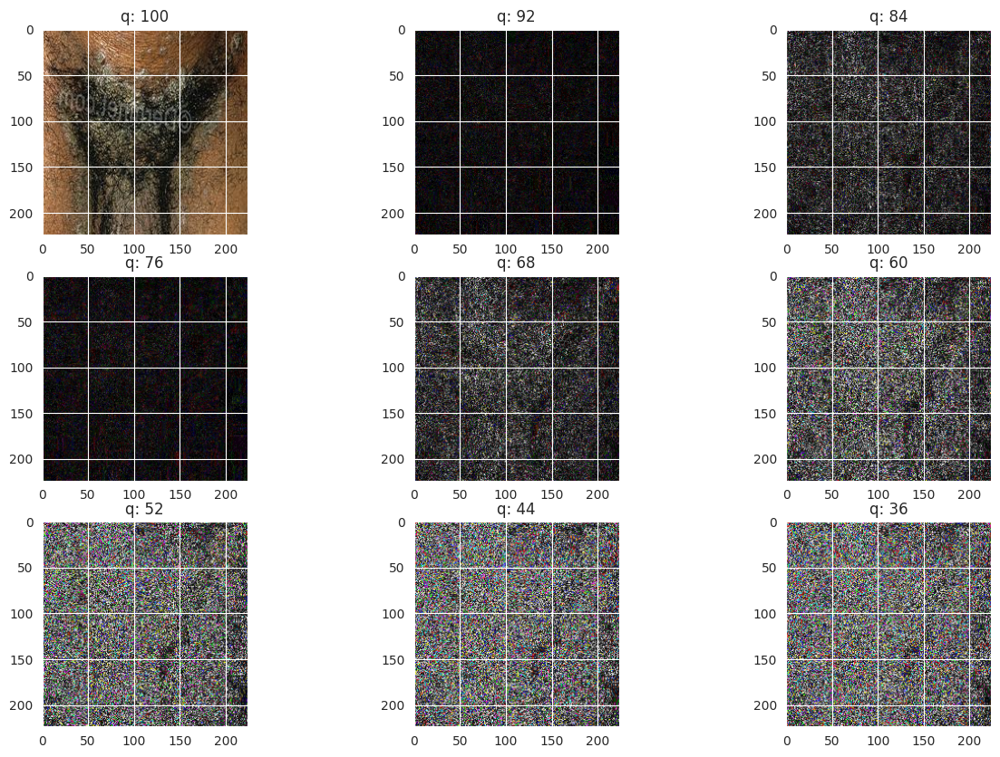

In [13]:
# Your main code:
augmented_dir = '/content/drive/My Drive/DATASET/output/manipulation/augmented'

# Call random_sample with folder_name and extension (if needed):
p = random_sample(augmented_dir, folder_name='Autoimun_Psoriasis', extension='jpg')  # Specify extension if necessary

orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

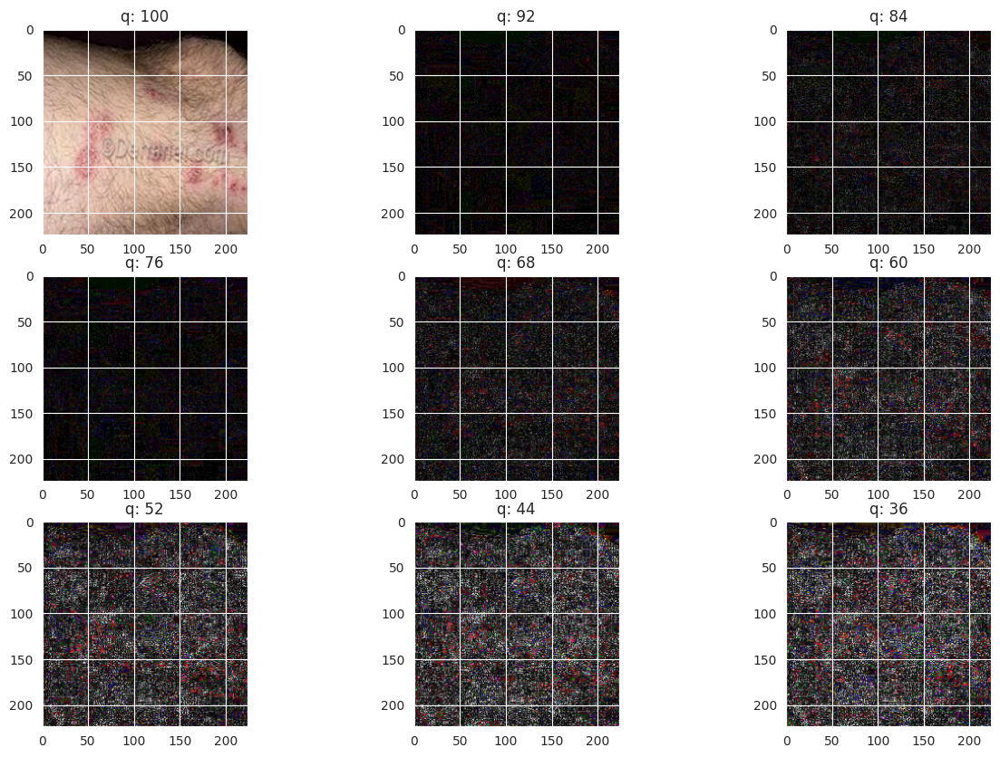

In [14]:
# Your main code:
augmented_dir = '/content/drive/My Drive/DATASET/output/manipulation/augmented'

# Call random_sample with folder_name and extension (if needed):
p = random_sample(augmented_dir, folder_name='Nonautoimun_Eczema', extension='jpg')  # Specify extension if necessary

orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

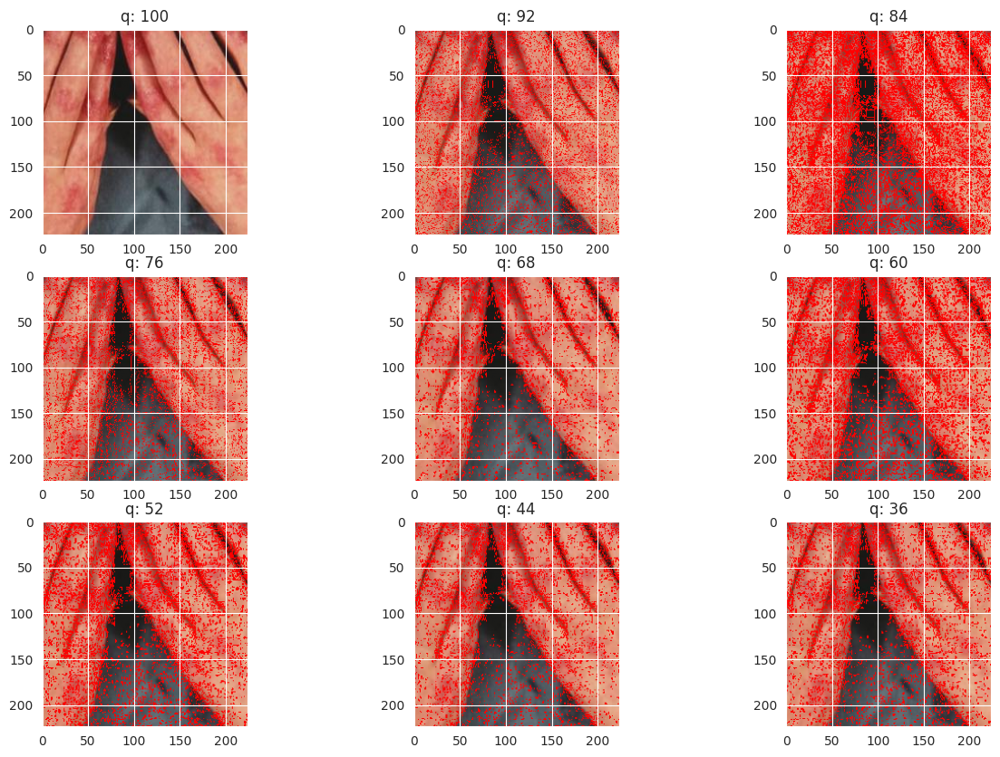

In [15]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
from PIL import Image
from io import BytesIO

# Main Dir
augmented_dir = '/content/drive/My Drive/DATASET/output/manipulation/augmented'

def random_sample(augmented_dir, subfolder):
    folder_path = os.path.join(augmented_dir, subfolder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]
    if image_files:
        return os.path.join(folder_path, random.choice(image_files))
    else:
        return None

def compute_ela_cv(path, quality):
    """
    Compute ELA using OpenCV.

    Args:
        path (str): Path to the image file.
        quality (int): JPEG compression quality (1-100).

    Returns:
        numpy.ndarray: ELA image as a NumPy array.
    """

    # Load the image
    img = cv2.imread(path)

    # Encode the image with the specified quality
    retval, buf = cv2.imencode('.jpg', img, [int(cv2.IMWRITE_JPEG_QUALITY), quality])

    # Decode the encoded image
    img_decoded = cv2.imdecode(buf, cv2.IMREAD_COLOR)

    # Convert images to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_decoded_gray = cv2.cvtColor(img_decoded, cv2.COLOR_BGR2GRAY)

    # Calculate ELA
    ela = cv2.absdiff(img_gray, img_decoded_gray)

    return ela


# ... (kode untuk base_dir, dll.) ...

# View random sample from the dataset
p = random_sample(augmented_dir, 'Autoimun_Dermatomyositis')

if p is not None:
    orig = cv2.imread(p)
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0

    init_val = 100
    columns = 3
    rows = 3

    fig = plt.figure(figsize=(15, 10))
    for i in range(1, columns*rows + 1):
        quality = init_val - (i - 1) * 8
        ela_img = compute_ela_cv(path=p, quality=quality)

        if i == 1:
            img = orig.copy()
        else:
            # Membuat mask dari ELA image
            threshold, mask = cv2.threshold(ela_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Menggabungkan mask dengan gambar asli
            img = orig.copy() #Fixed indentation here
            img[mask == 255] = [1, 0, 0] #Fixed indentation here

        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text(f'q: {quality}')
        plt.imshow(img)

    plt.show()
else:
    print("No images found in the specified subfolder.")

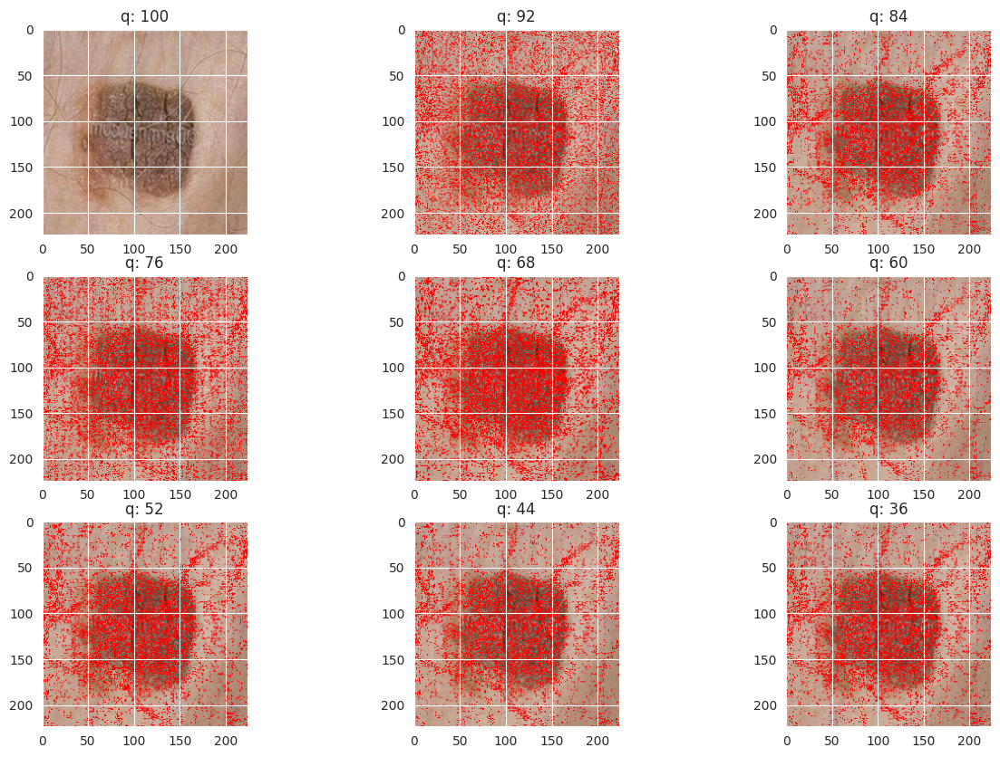

In [16]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
from PIL import Image
from io import BytesIO

# Main Dir
augmented_dir = '/content/drive/My Drive/DATASET/output/manipulation/augmented'

def random_sample(augmented_dir, subfolder):
    folder_path = os.path.join(augmented_dir, subfolder)
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif'))]
    if image_files:
        return os.path.join(folder_path, random.choice(image_files))
    else:
        return None

def compute_ela_cv(path, quality):
    """
    Compute ELA using OpenCV.

    Args:
        path (str): Path to the image file.
        quality (int): JPEG compression quality (1-100).

    Returns:
        numpy.ndarray: ELA image as a NumPy array.
    """

    # Load the image
    img = cv2.imread(path)

    # Encode the image with the specified quality
    retval, buf = cv2.imencode('.jpg', img, [int(cv2.IMWRITE_JPEG_QUALITY), quality])

    # Decode the encoded image
    img_decoded = cv2.imdecode(buf, cv2.IMREAD_COLOR)

    # Convert images to grayscale
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_decoded_gray = cv2.cvtColor(img_decoded, cv2.COLOR_BGR2GRAY)

    # Calculate ELA
    ela = cv2.absdiff(img_gray, img_decoded_gray)

    return ela


# ... (kode untuk base_dir, dll.) ...

# View random sample from the dataset
p = random_sample(augmented_dir, 'Nonautoimun_Keratosis_Seborrheic')

if p is not None:
    orig = cv2.imread(p)
    orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0

    init_val = 100
    columns = 3
    rows = 3

    fig = plt.figure(figsize=(15, 10))
    for i in range(1, columns*rows + 1):
        quality = init_val - (i - 1) * 8
        ela_img = compute_ela_cv(path=p, quality=quality)

        if i == 1:
            img = orig.copy()
        else:
            # Membuat mask dari ELA image
            threshold, mask = cv2.threshold(ela_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Menggabungkan mask dengan gambar asli
            img = orig.copy() #Fixed indentation here
            img[mask == 255] = [1, 0, 0] #Fixed indentation here

        ax = fig.add_subplot(rows, columns, i)
        ax.title.set_text(f'q: {quality}')
        plt.imshow(img)

    plt.show()
else:
    print("No images found in the specified subfolder.")

In [12]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

In [13]:
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input,
    validation_split=0.2
)

val_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
)

In [14]:
# Split the data into three categories.
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 5120 validated image filenames belonging to 8 classes.
Found 1280 validated image filenames belonging to 8 classes.
Found 1600 validated image filenames belonging to 8 classes.


In [15]:
# Load the pretained model
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

base_model.trainable = False

In [46]:
import tensorflow as tf
from tensorflow.keras.layers import Resizing, Rescaling
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow.keras.callbacks import TensorBoard # Import TensorBoard

# Assuming 'resize_and_rescale' was intended to resize and rescale the input images,
# the following code replaces it with the corresponding Keras preprocessing layers:
#from tensorflow import keras
# Instead of importing keras directly, import Resizing and Rescaling from tensorflow.keras.layers.experimental.preprocessing

def create_tensorboard_callback(dir_name, experiment_name):
  """
  Creates a TensorBoard callback instand to store log files.

  Stores log files with the filepath:
    "dir_name/experiment_name/current_datetime/"

  Args:
    dir_name: target directory to store TensorBoard log files
    experiment_name: name of experiment directory (e.g. efficientnet_model_1)
  """
  log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = TensorBoard(
      log_dir=log_dir
  )
  print(f"Saving TensorBoard log files to: {log_dir}")
  return tensorboard_callback


inputs = base_model.input
# Resize the input images to the desired size
#x = Resizing(224, 224)(inputs) # Resize images to (224, 224)
# Rescale the pixel values to the range [0, 1]
#x = Rescaling(1./255)(x) # Rescale pixel values to [0, 1]

inputs = tf.keras.layers.Input(shape=(224, 224, 3)) # Define the input layer explicitly
x = base_model(inputs)  # Pass the input to the base model
# x = Dropout(0.2)(x)
# x = Conv2D(256, (3, 3), activation='relu')(x)
# x = MaxPooling2D(2, 2)(x)
X = Dropout(0.2)(x)
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.2)(x)

outputs = tf.keras.layers.Dense(8, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)


model.compile(
    optimizer=tf.keras.optimizers.RMSprop(0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1024)                │      64,226,304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 8)                   │           4,104 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 67,013,192 (255.64 MB)

 Trainable params: 66,979,080 (255.50 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [19]:
# Create checkpoint callback
checkpoint_path = "autoimun_nonautoimun_classification_model_checkpoint.weights.h5" # Change the file extension to .weights.h5
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, min_lr=1e-4)

In [20]:
import tensorflow as tf
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LambdaCallback
import datetime

# Custom function for early stopping based on accuracy
def early_stop_by_accuracy(epoch, logs):
    if logs.get('accuracy') is not None and logs['accuracy'] >= 0.96:
        print("\nReached 96% accuracy! Stopping training...")
        self.model.stop_training = True  # Assuming 'self' refers to the callback


# Create the LambdaCallback for early stopping by accuracy
accuracy_stopping = LambdaCallback(on_epoch_end=early_stop_by_accuracy)


reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=2, min_lr=1e-4)

# Pelatihan model
history = model.fit(
    train_images,
    steps_per_epoch=len(train_images),
    validation_data=val_images,
    validation_steps=len(val_images),
    epochs=100,
    callbacks=[
        early_stopping,  # Early stopping based on val_loss
        accuracy_stopping, # Early stopping based on accuracy
        create_tensorboard_callback("training_logs", "autoimun_classification"),
        checkpoint_callback,
        reduce_lr
    ]
)

Saving TensorBoard log files to: training_logs/autoimun_classification/20241129-115822
Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


160/160 ━━━━━━━━━━━━━━━━━━━━ 307s 2s/step - accuracy: 0.1551 - loss: 3.9594 - val_accuracy: 0.3906 - val_loss: 1.6992 - learning_rate: 1.0000e-05
Epoch 2/100
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 883us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 3/100


/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)
/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss
  current = self.get_monitor_value(logs)
/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/model_checkpoint.py:206: UserWarning: Can save best model only with val_accuracy available, skipping.
  self._save_model(epoch=epoch, batch=None, logs=logs)
/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/callback_list.py:96: UserWarning: Learning rate reduction is conditioned on metric `val_loss` which is not available. Available metrics are: accuracy,loss,learnin

160/160 ━━━━━━━━━━━━━━━━━━━━ 286s 2s/step - accuracy: 0.3281 - loss: 2.3439 - val_accuracy: 0.5016 - val_loss: 1.3917 - learning_rate: 1.0000e-05
Epoch 4/100
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 304us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 5/100
160/160 ━━━━━━━━━━━━━━━━━━━━ 292s 2s/step - accuracy: 0.4036 - loss: 1.8584 - val_accuracy: 0.5461 - val_loss: 1.2438 - learning_rate: 1.0000e-05
Epoch 6/100
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 7/100
160/160 ━━━━━━━━━━━━━━━━━━━━ 314s 2s/step - accuracy: 0.4646 - loss: 1.5802 - val_accuracy: 0.5633 - val_loss: 1.1774 - learning_rate: 1.0000e-05
Epoch 8/100
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - learning_rate: 1.0000e-05
Epoch 9/100
160/160 ━━━━━━━━━━━━━━━━━━━━ 287s 2s/step - accuracy: 0.5011 - loss: 1.4144 - val_accuracy: 0.5898 - val_loss: 1.1214 - learning_rate: 1.0000e-05
Epoch

In [21]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.69049
Test Accuracy: 74.50%


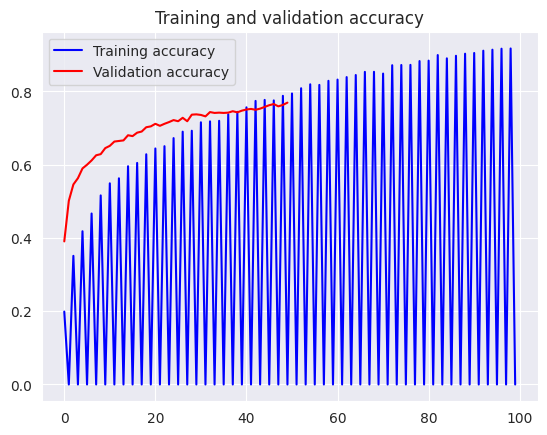

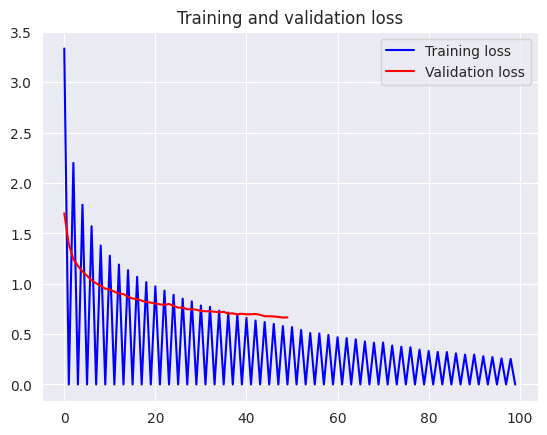

In [22]:
import matplotlib.pyplot as plt

accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

# Get the number of epochs for training and validation data
epochs_training = range(len(accuracy))
epochs_validation = range(len(val_accuracy))

# Plot training and validation accuracy
plt.plot(epochs_training, accuracy, 'b', label='Training accuracy')
plt.plot(epochs_validation, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()  # Create a new figure for the loss plot

# Plot training and validation loss
plt.plot(epochs_training, loss, 'b', label='Training loss')
plt.plot(epochs_validation, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [23]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the label
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 10 predictions: {pred[:10]}')

50/50 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step
The first 10 predictions: ['Autoimun_Psoriasis', 'Autoimun_Psoriasis', 'Autoimun_Vitiligo', 'Autoimun_Lichen_Planus', 'Nonautoimun_Tinea', 'Autoimun_Psoriasis', 'Autoimun_Vitiligo', 'Autoimun_Vitiligo', 'Nonautoimun_Eczema', 'Autoimun_Lichen_Planus']


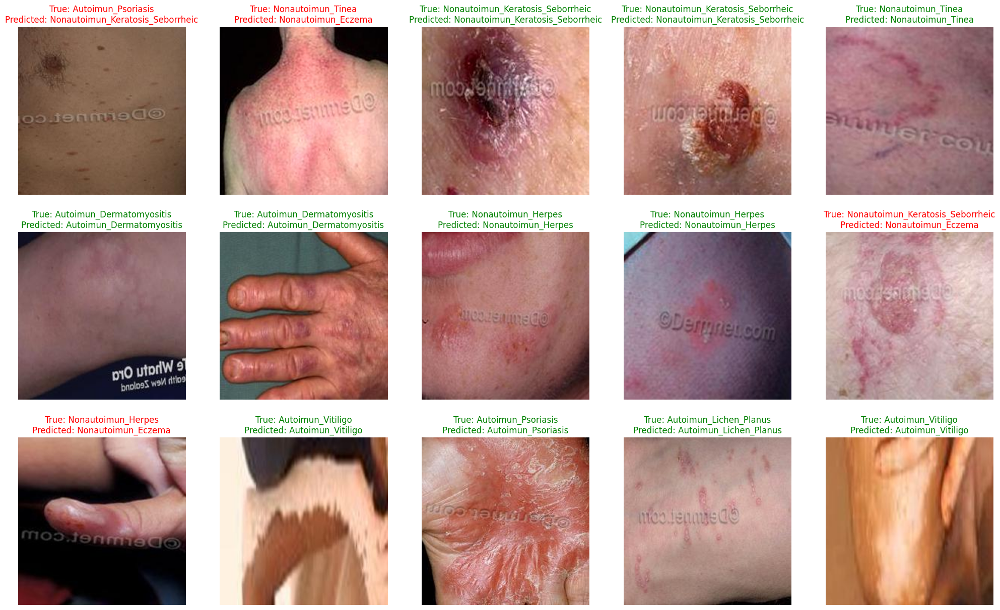

<Figure size 640x480 with 0 Axes>

In [24]:
 # Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

In [25]:
y_test = list(test_df.Label)
print(classification_report(y_test, pred))

                                  precision    recall  f1-score   support

        Autoimun_Dermatomyositis       0.90      0.91      0.90       203
          Autoimun_Lichen_Planus       0.73      0.65      0.69       183
              Autoimun_Psoriasis       0.68      0.65      0.67       196
               Autoimun_Vitiligo       0.99      0.99      0.99       222
              Nonautoimun_Eczema       0.55      0.55      0.55       197
              Nonautoimun_Herpes       0.75      0.68      0.71       207
Nonautoimun_Keratosis_Seborrheic       0.89      0.85      0.87       192
               Nonautoimun_Tinea       0.50      0.63      0.56       200

                        accuracy                           0.74      1600
                       macro avg       0.75      0.74      0.74      1600
                    weighted avg       0.75      0.74      0.75      1600



In [26]:
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

,precision,recall,f1-score,support
Autoimun_Dermatomyositis,0.898058,0.911330,0.904645,203.000
Autoimun_Lichen_Planus,0.734568,0.650273,0.689855,183.000
Autoimun_Psoriasis,0.684492,0.653061,0.668407,196.000
Autoimun_Vitiligo,0.986547,0.990991,0.988764,222.000
Nonautoimun_Eczema,0.547739,0.553299,0.550505,197.000
Nonautoimun_Herpes,0.746032,0.681159,0.712121,207.000
Nonautoimun_Keratosis_Seborrheic,0.891304,0.854167,0.872340,192.000
Nonautoimun_Tinea,0.504000,0.630000,0.560000,200.000
accuracy,0.745000,0.745000,0.745000,0.745
macro avg,0.749093,0.740535,0.743330,1600.000


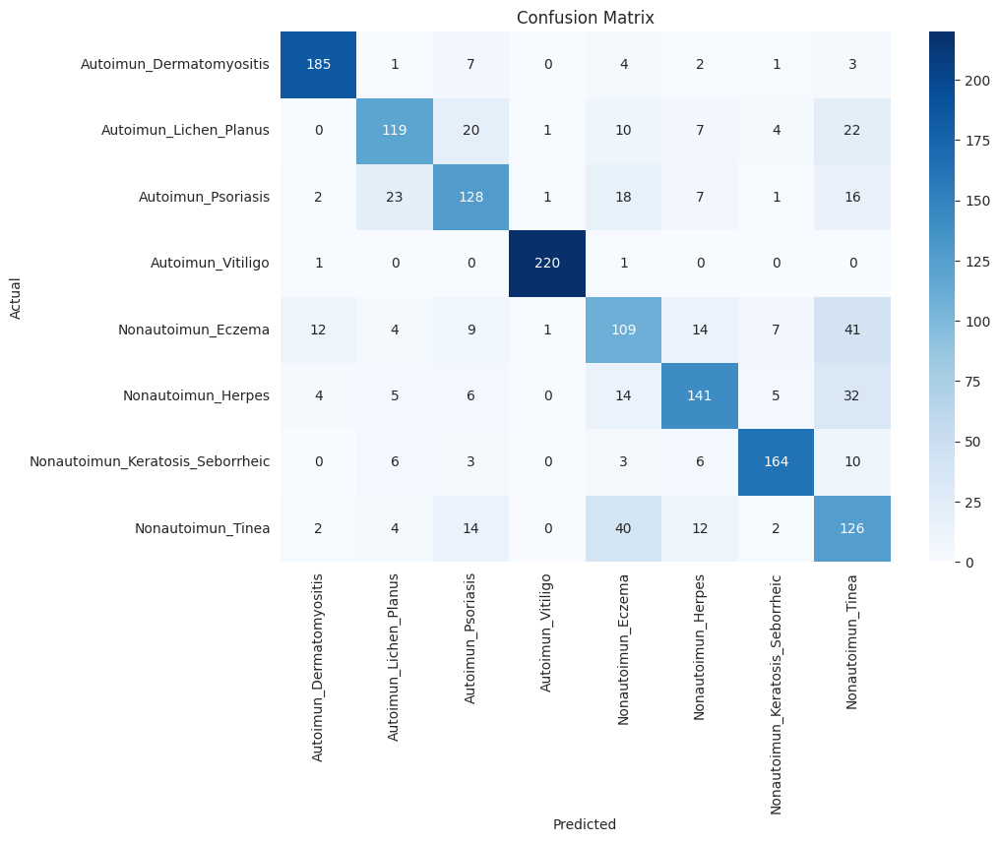

In [27]:
# Import the necessary function from scikit-learn
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns


def make_confusion_matrix(y_true, y_pred, labels):
    """
    Generates and displays a confusion matrix.

    Args:
        y_true: The true labels.
        y_pred: The predicted labels.
        labels: A list of label names.
    """
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=labels, yticklabels=labels)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title("Confusion Matrix")
    plt.show()


# Now you can use make_confusion_matrix in your code
# Use the complete y_test list instead of slicing it to match the length of pred
make_confusion_matrix(y_test, pred, list(labels.values()))

In [58]:
last_layer_name = model.layers[-1].name
print(last_layer_name)

dense_11


In [76]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from PIL import Image

def get_img_array(img_path, size):
    """
    Memuat gambar dan mengubahnya menjadi array NumPy.
    """
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Generates a heatmap using Grad-CAM.
    """
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array by "how important this channel is"
    # with regard to the top predicted class then sum all the channels to obtain the heatmap class activation.
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis] # @ is matrix multiplication operator for tensors in Tensorflow
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    """
    Saves and displays the image with the Grad-CAM heatmap overlayed.
    """
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

for layer in reversed(model.layers):
    # Modified condition to include pooling layers as well
    if "conv" in layer.name or "pool" in layer.name:
        last_conv_layer_name = layer.name
        break
else:
    # Handle the case where no suitable layer is found, provide a more informative message
    raise ValueError("No convolutional or pooling layer found in the model. Grad-CAM typically requires these layers.")

print(f"Using layer: {last_conv_layer_name}")

img_size = (224, 224, 3)

# Remove last layer's softmax
model.layers[-1].activation = None

ValueError: No convolutional or pooling layer found in the model. Grad-CAM typically requires these layers.

InvalidArgumentError: {{function_node __wrapped__Mean_device_/job:localhost/replica:0/task:0/device:CPU:0}} Invalid reduction dimension (2 for input with 2 dimension(s) [Op:Mean]

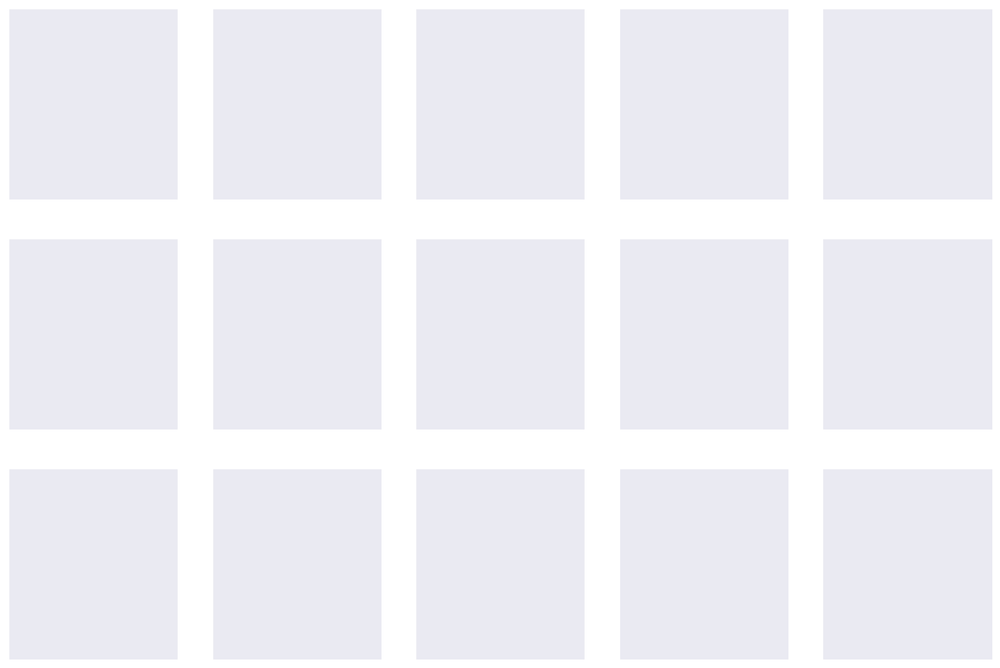

In [74]:
# Display the part of the pictures used by the neural network to classify the pictures
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    img_path = test_df.Filepath.iloc[random_index[i]]
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    ax.imshow(plt.imread(cam_path))
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}")
plt.tight_layout()
plt.show()